# **Computer Vision (H02A5a)**

##Assignment 2: Crafting and learning features



##1 Import libraries

---



We first import all necessary librarieis:

In [ ]:
!pip install opencv-python==3.4.2.17
#!pip install opencv-python==4.0.1.23

In [ ]:
!pip install imutils

In [ ]:
pip install scikit-image

For the transfer learning approach, we use precomputed image features from Oxford's VGG Face Descriptor.

In [ ]:
# install the vggface package, suggested in the assignment
!pip install git+https://github.com/rcmalli/keras-vggface.git
!pip install -U keras

  Cloning https://github.com/rcmalli/keras-vggface.git to /tmp/pip-req-build-852_q4_u
  Running command git clone -q https://github.com/rcmalli/keras-vggface.git /tmp/pip-req-build-852_q4_u
  Created wheel for keras-vggface: filename=keras_vggface-0.6-cp36-none-any.whl size=8311 sha256=fb100483ac79f28a475d1919861292c1a15c0f623548b44973f80331df48d862
  Stored in directory: /tmp/pip-ephem-wheel-cache-jnkxt6l1/wheels/36/07/46/06c25ce8e9cd396dabe151ea1d8a2bc28dafcb11321c1f3a6d
Successfully built keras-vggface
Requirement already up-to-date: keras in /usr/local/lib/python3.6/dist-packages (2.3.1)


In [ ]:
import sklearn
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly import tools,subplots

import numpy as np
from numpy import newaxis

import cv2
import os

from urllib.request import urlretrieve
from zipfile import ZipFile
import tarfile
from urllib import request

from time import time
import time
import logging
import matplotlib.pyplot as plt
import random
from random import randint

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import fetch_lfw_people
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC

import seaborn as sns; sns.set()

from skimage.color import rgb2gray
from skimage.io import imread, imshow
from skimage.transform import resize
from skimage.feature import hog
from skimage import exposure
from skimage import data, color, feature
from skimage.transform import pyramid_gaussian
from sklearn.externals import joblib
from imutils.object_detection import non_max_suppression
import cv2
import os
import glob

from keras_vggface.vggface import VGGFace
from keras_vggface import utils
import tensorflow as tf
import numpy as np
from tensorflow.python.keras.preprocessing import image as tf_image

%matplotlib inline
plt.rcParams["axes.grid"] = False

from PIL import Image

import imutils
import pprint

from mpl_toolkits.axes_grid1 import make_axes_locatable

# import json
from skimage import color
from skimage.feature import hog
from sklearn import svm
from sklearn.metrics import classification_report,accuracy_score
from sklearn.metrics import confusion_matrix

# Set notebook mode to work in offline
pyo.init_notebook_mode()

## 2 Download images

---



We choose to use our own dataset, which has been uploaded to one personal site for download. The faces we picked were:

*   Skylar Astin (A)
*   Cate Blanchett (B)
*   Dane Cook (C)
*   Tilda Swinton (D)


In [ ]:
# Set our working path
base_path = "/content/sample_data/CV__Group_assignment"
if not os.path.isdir(base_path):
  os.makedirs(base_path)

In [ ]:
#please try another link commented below if this link does not work :)

our_face_dataset_url = "https://drive.google.com/uc?export=download&id=1zNMlAgdfxoCjH6csVW-QfKdvDXaQKqZP"
#our_face_dataset_url = "https://onedrive.live.com/download?cid=F0C5C945578CC7E8&resid=F0C5C945578CC7E8%21254&authkey=AJ8ev3vqw37Xpfs"
#our_face_dataset_url = "https://drive.google.com/uc?export=download&id=1TyedMd3CVecnXAdMsEkAsRqrw3z2YuZO"
#our_face_dataset_url = "https://drive.google.com/uc?export=download&id=1BxUNd3PoEbTfGuWcC5BaJrfNiE2wWA-G"

# define download function
def download(url, file):
    if not os.path.isfile(file):
        print("Download file... " + file + " ...")
        urlretrieve(url,file)
        print("File downloaded")

download(our_face_dataset_url,'/content/sample_data/CV__Group_assignment/FaceData.zip')
print("All the files are downloaded")

All the files are downloaded


In [ ]:
# Here the downloaded file is a zip file so we use the function below to unzip it
def uncompress_features_labels(dir):
    if(os.path.isdir('data')):
        print('Data extracted')
    else:
        with ZipFile(dir) as zipf:
            zipf.extractall('data')

uncompress_features_labels('/content/sample_data/CV__Group_assignment/FaceData.zip')

In [ ]:
# Set our working path again
base_path = "/content/data/FaceData/"
if not os.path.isdir(base_path):
  os.makedirs(base_path)

In [ ]:
%cd /content/data/FaceData

/content/data/FaceData


##3 Preprocessing and Dataset Construction

---



Now we have our dataset ready to use! We now use a stack to show them in four rows, which represents the corresponding celebrities (A, B, C, D).

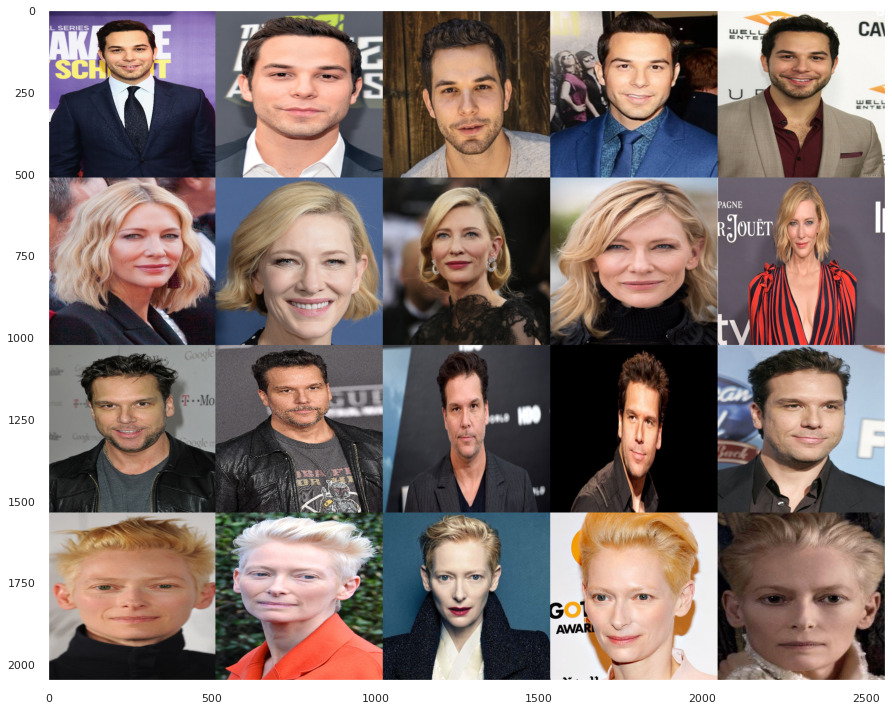

In [ ]:
image_list = ['Astin_'+str(i+1)+'.jpg' for i in range(30)]+['Cate_'+str(i+1)+'.jpg' for i in range(30)]+['Cook_'+str(i+1)+'.jpg' for i in range(10)]+['Tilda_'+str(i+1)+'.jpg' for i in range(10)] #Name of the images

images = []
for i in range(80):
    image = cv2.imread(base_path+image_list[i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #By default imread reads the images in BGR space, so convert it into RGB
    image = cv2.resize(image,(512,512)) #Resize the images in order to plot it well. This will cause some images to be stretched
    images.append(image)

personA = np.hstack((images[0],images[1],images[2],images[3],images[4]))
personB = np.hstack((images[30],images[31],images[32],images[33],images[34]))
personC = np.hstack((images[60],images[61],images[62],images[63],images[64]))
personD = np.hstack((images[70],images[71],images[72],images[73],images[74]))

all_images = np.vstack((personA,personB,personC,personD))
plt.figure(figsize=(15,20))
plt.imshow(all_images)

Here we extract faces out using haarcascade_frontalface_default.xml

In [ ]:
trained_haarcascade_url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml"

with request.urlopen(trained_haarcascade_url) as r, open(os.path.join(base_path, "haarcascade_frontalface_default.xml"), 'wb') as f:
    f.write(r.read())

In [ ]:
face_size = 100 #Faces will be resized 100 x 100 pixels
NUM_EIGEN_FACES = 20 # Number of EigenFaces

face_list = ['Astin_Face_'+str(i+1)+'.jpg' for i in range(30)]+['Cate_Face_'+str(i+1)+'.jpg' for i in range(30)]+['Cook_Face_'+str(i+1)+'.jpg' for i in range(10)]+['Tilda_Face_'+str(i+1)+'.jpg' for i in range(10)] #Face names

# Create the haar cascade
faceCascade = cv2.CascadeClassifier(os.path.join(base_path, "haarcascade_frontalface_default.xml"))

facePath = '/content/data/FaceData/ProcessedData/'

for i in range(80):
    # Read the image
    image = cv2.imread('/content/data/FaceData/'+image_list[i])
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #Convert the images to grayscale

    # Detect faces in the image

    faces = faceCascade.detectMultiScale(
        gray,
        scaleFactor=1.2,
        minNeighbors=5,
        minSize=(30, 30),
        flags=cv2.CASCADE_SCALE_IMAGE
    )

    for (x, y, w, h) in faces:
        crop_face = gray[y:y+h, x:x+w]
        crop_face = cv2.resize(crop_face, (face_size, face_size))
        image_name = face_list[i]
        cv2.imwrite(os.path.join(facePath, image_name), crop_face)

Those extracted faces were saved into `/content/data/FaceData/ProcessedData/`. We now display them below

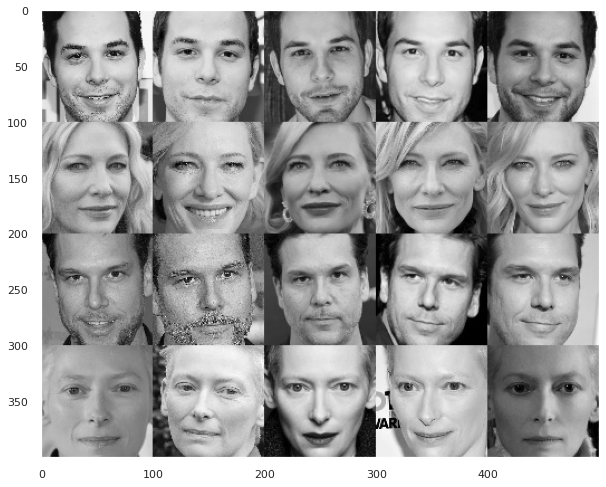

In [ ]:
face_list = ['Astin_Face_'+str(i+1)+'.jpg' for i in range(30)]+['Cate_Face_'+str(i+1)+'.jpg' for i in range(30)]+['Cook_Face_'+str(i+1)+'.jpg' for i in range(10)]+['Tilda_Face_'+str(i+1)+'.jpg' for i in range(10)] #Face names

faces = []
for i in range(80):
    face = cv2.imread(facePath+face_list[i])
    faces.append(face)

personAface = np.hstack((faces[0],faces[1],faces[2],faces[3],faces[4]))
personBface = np.hstack((faces[30],faces[31],faces[32],faces[33],faces[34]))
personCface = np.hstack((faces[60],faces[61],faces[62],faces[63],faces[64]))
personDface = np.hstack((faces[70],faces[71],faces[72],faces[73],faces[74]))

all_faces = np.vstack((personAface,personBface,personCface,personDface))
plt.figure(figsize=(10,12))
plt.imshow(all_faces)

Now it is time to get the face data needed for classification. 


*   For training data, first 20 images of both Skylar (A) and Cate (B) were considered.
*   For testing data, last 10 images of both Skylar (A) and Cate (B) were considered. 
*   At the same time, we make a complete testing dataset with above Skylar (A) and Cate (B) but adding Dane (C) and Tilda (D) together.


 




In [ ]:
face_list_names = ['Astin_Face_'+str(i+1)+'.jpg' for i in range(30)]+['Cate_Face_'+str(i+1)+'.jpg' for i in range(30)]+['Cook_Face_'+str(i+1)+'.jpg' for i in range(10)]+['Tilda_Face_'+str(i+1)+'.jpg' for i in range(10)] #Face names
face_list = list()

for i in range(80):
    processed_face = Image.open(facePath+face_list_names[i])
    processed_face = np.array(processed_face.getdata())
    face_list.append(processed_face)

X = np.array(face_list)
X_train = np.concatenate((X[:20], X[30:50]), axis=0) #A,B
X_test_all = np.concatenate((X[20:30], X[50:60], X[60:70], X[70:80]), axis=0) #A(0),B(1),C,D
X_test = np.concatenate((X[20:30], X[50:60]), axis=0) #A(0),B(1)

y_train = np.array([0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1], dtype='int64') #A(0),B(1)
y_test = np.array([0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1], dtype='int64') #A(0),B(1)
y_test_all = np.array([0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1], dtype='int64') #A(0),B(1),C(0),D(1)
target_names = np.array(['Skylar Astin', 'Cate Blanchett'], dtype='<U17')

n_classes = 2
w = 100
h = 100

##4 Feature Representation

---



###4.1 Handcrafted Features

#### **What is a Feature Descriptor**
A way of representing and simplifying image by extracting only useful information and discarding extra information from the image is known as 'feature vectors'


**What does HOG mean?**



**Histogram**:
The data is organized in bins.

**Oriented**:
The orientation of each pixel of the object being scanned.

**Gradients**:
The intensity change or gradient in the pixels of the object being scanned.

**Feature**:
Certain characteristics in the object that make it unique.

**Descriptor**:
This a feature vector computed using above attributes describing the information regarding the object’s features. Two descriptors can be compared to check if they are similar.

#### **HOG Procedure**

The Histogram of Oriented Gradients is a straightforward feature extraction procedure that was developed in the context of identifying pedestrians within images.
HOG involves the following steps:

1. Optionally pre-normalize images (resizing or color normalisation). This leads to features that resist dependence on variations in illumination [7].
2. Compute the gradient vector of every pixel, as well as its magnitude and direction.
3. Subdivide the image into cells of a predetermined size, and compute a histogram of the gradient orientations within each cell [6].
4. Normalize the histograms in each cell by comparing to the block of neighboring cells. This further suppresses the effect of illumination across the image.
5. Construct a one-dimensional feature vector from the information in each cell.

Typically, a feature descriptor [6] converts an image of size width x height x 3 (channels ) to a feature vector / array of length n. In this case of the HOG feature descriptor, the input image is of size 200 x 100 x 3 and the output feature vector is of length 3780.

A fast HOG extractor is built into the Scikit-Image project, and we can try it out relatively quickly and visualize the oriented gradients within each cell:

 Step 1) Read the image




(100, 100, 3)


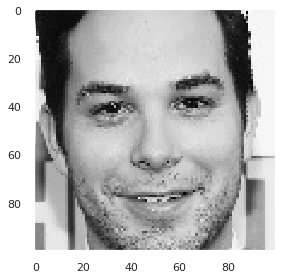

In [ ]:
plt.rcParams["axes.grid"] = False
img = faces[0]
imshow(img)
print(img.shape)

Step 2) Resize image


(200, 100, 3)


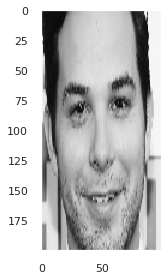

In [ ]:
#Resizing image 
resized_img = resize(img, (200,100)) 
imshow(resized_img) 
print(resized_img.shape)

Step 3) Calculate the HOG of the gray scaled image with initial parameters.



In [ ]:
# define parameters of HOG feature extraction
orientations = 9
pixels_per_cell = (8, 8)
cells_per_block = (2, 2)
default_params = {'orientations': 9,
    'pixels_per_cell': (8, 8),
    'cells_per_block': (2, 2),
    'transform_sqrt': True,
    'block_norm': "L2"}

#creating hog features 
def create_hog_features(img, params=default_params):
  orientations = params['orientations']
  pixels_per_cell = params['pixels_per_cell']
  cells_per_block = params['cells_per_block']
  transform_sqrt = params['transform_sqrt']
  block_norm = params['block_norm']
  # load the image, convert it to grayscale, and detect edges
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
  edged = imutils.auto_canny(gray)
  resized_img = resize(img, (200,100)) 

  #creating hog features 
  fd, hog_image = hog(resized_img, orientations=orientations, pixels_per_cell=pixels_per_cell, cells_per_block=cells_per_block, block_norm=block_norm, feature_vector=True, visualize=True, transform_sqrt=transform_sqrt)# fd= feature descriptor
  return fd, hog_image, resized_img

def create_hog_features_for_images(img_faces, params=default_params):
    hog_faces = []
    resized_faces = []
    features = []
    for i in range(len(img_faces)):
        img = img_faces[i]
        #extracting hog features 
        fd, hog_image, resized_img = create_hog_features(img, params)

        # Rescale histogram for better display 
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10)) 
        hog_faces.append(hog_image)
        resized_faces.append(resized_img)
        features.append(fd)
    return hog_faces, resized_faces, features



Now we create HOG features for different parameters. Then choose the one which is more descriptive. In this case the first HOG image has most visible features in the image i.e., 9504 features.

This feature descriptor technique is very different from the grabbing object technique used in the previous assignment. To grab an object a preprocessing technique was used such as gaussian smoothing and bilateral filtering, and then the color thresholding was used to filter out the object from the scene. Whereas, for HOG features, we first extracted the Region of Interest using face cascades and then converted the facial images to gray scale to generate the HOG feature vectors.

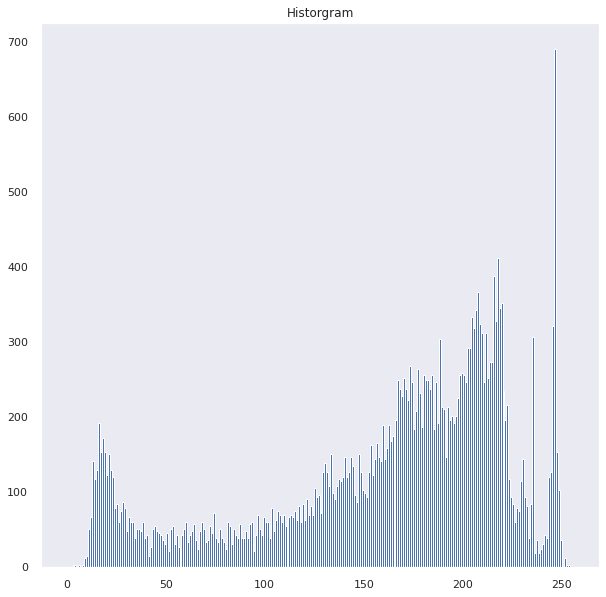

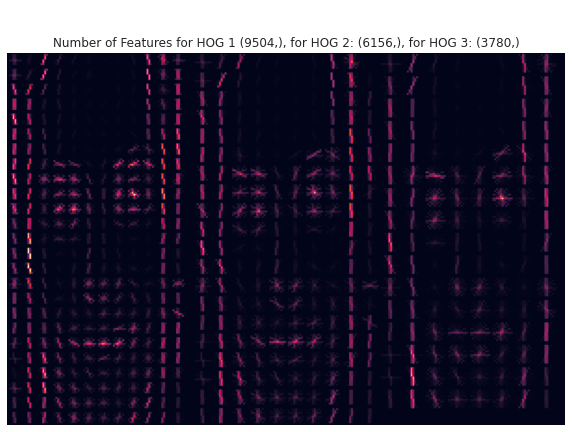

In [ ]:
plt.figure(figsize=(10,10))
plt.hist(faces[0].ravel(),256,[0,256]);
plt.title("Historgram")
plt.show()

plt.rcParams["axes.grid"] = False

s1, hog_face1, _ = create_hog_features(faces[0])
# Rescale histogram for better display 
hog_image_rescaled1 = exposure.rescale_intensity(hog_face1, in_range=(0, 10)) 

params2 = {'orientations': 9, 'pixels_per_cell': (10, 10), 'cells_per_block': (2, 2), 'transform_sqrt':True, 'block_norm':'L2'}
s2, hog_face2, resized_img = create_hog_features(faces[0], params2)
# Rescale histogram for better display 
hog_image_rescaled2 = exposure.rescale_intensity(hog_face2, in_range=(0, 10)) 

params3 = {'orientations': 9, 'pixels_per_cell': (12, 12), 'cells_per_block': (2, 2),'transform_sqrt':True, 'block_norm':'L2'}
s3, hog_face3, _ = create_hog_features(faces[0], params3)
# Rescale histogram for better display 
hog_image_rescaled3 = exposure.rescale_intensity(hog_face3, in_range=(0, 10)) 

h2 = np.hstack((hog_image_rescaled1, hog_image_rescaled2, hog_image_rescaled3))
plt.figure(figsize=(10,12))
plt.title("\n\nNumber of Features for HOG 1 {}, for HOG 2: {}, for HOG 3: {}".format(s1.shape, s2.shape, s3.shape))
plt.axis('off')
plt.imshow(h2)


Next we compute HOG features for all the face dataset. Notice the last row has HOG vectors for the full image of the person but since our main focus is to only detect and distinguish among the faces, we extract and process only the features of faces.

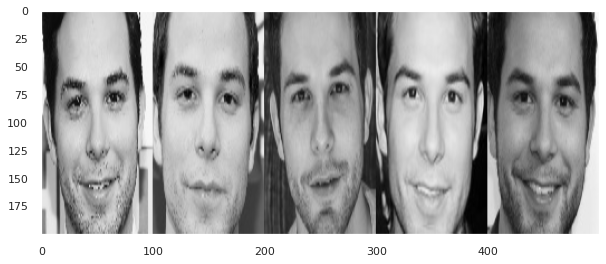

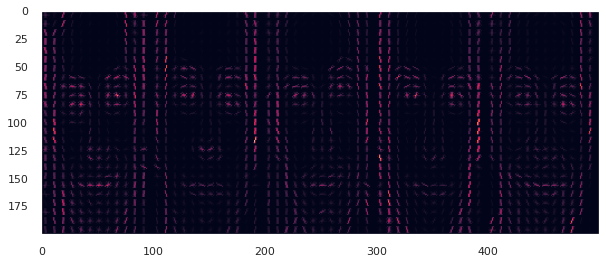

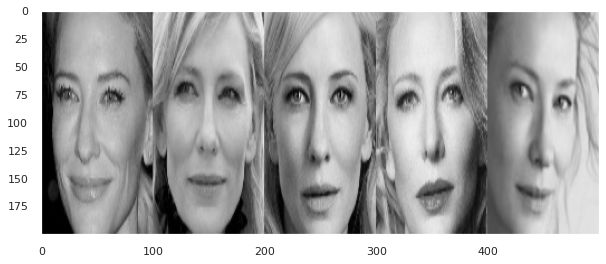

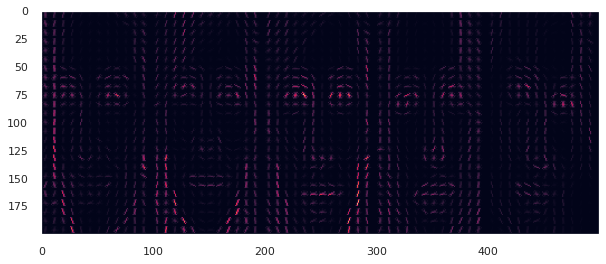

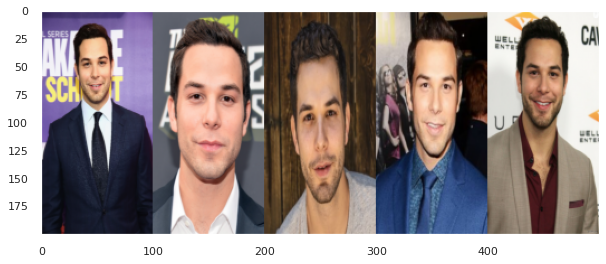

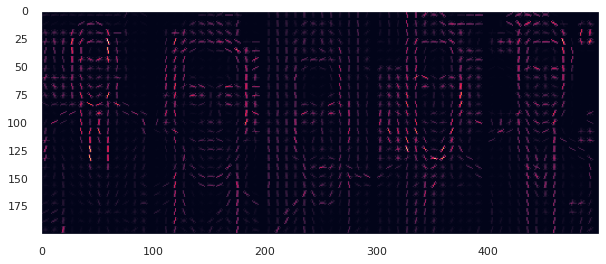

In [ ]:
hog_faces, resized_faces, _ = create_hog_features_for_images(faces[:20]+faces[31:50])

h1 = np.hstack((resized_faces[0],resized_faces[1],resized_faces[2],resized_faces[3],resized_faces[4]))
plt.figure(figsize=(10,12))
plt.imshow(h1)

h2 = np.hstack((hog_faces[0],hog_faces[1],hog_faces[2],hog_faces[3],hog_faces[4]))
plt.figure(figsize=(10,12))
plt.imshow(h2)

h1 = np.hstack((resized_faces[31],resized_faces[32],resized_faces[33],resized_faces[34],resized_faces[35]))
plt.figure(figsize=(10,12))
plt.imshow(h1)

h2 = np.hstack((hog_faces[31],hog_faces[32],hog_faces[33],hog_faces[34],hog_faces[35]))
plt.figure(figsize=(10,12))
plt.imshow(h2)

hog_faces2, resized_faces, _ = create_hog_features_for_images(images[:10])

h1 = np.hstack((resized_faces[0],resized_faces[1],resized_faces[2],resized_faces[3],resized_faces[4]))
plt.figure(figsize=(10,12))
plt.imshow(h1)

h2 = np.hstack((hog_faces2[0],hog_faces2[1],hog_faces2[2],hog_faces2[3],hog_faces2[4]))
plt.figure(figsize=(10,12))
plt.imshow(h2)



Next we train the model using KNeighborsClassifier and calculate the Euclidean distances between feature outputs of the training images and test images and classify the test images of person A and B provided. The training dataset has HOG features for 40 facial images of person A and B and the test images have HOG features for 20 facial images of person A and B.

In [ ]:
# initialize the data matrix and labels
training_images = faces[:20] + faces[30:50]

def train_images(params, training_images=training_images, training_labels=y_train):
	data = []
	labels = []
	# prepare_training_images
	# loop over the image paths in the training set
	print("Training {} images".format(len(training_images)))
	for  (i, image) in enumerate(training_images):
		# extract the celebrity from face
		celebrity = "Cate Blanchett"
		if (training_labels[i] == 0):
			celebrity = "Skylar Astin"
		print("[INFO] extracting features... for image {}".format(face_list_names[i]))
		# extract Histogram of Oriented Gradients from the face
		H, hog_face, _ = create_hog_features(image, params)
		
		# update the data and labels
		data.append(H)
		labels.append(celebrity)
	print("Training Succeeded")
	return data, labels

test_set = faces[20:30]+faces[50:60]
def test_images(params, test_images=test_set, test_labels=y_test):
	resulted_imgs = []
	predictions = []
	data = []
	labels = []
	print("Testing {} images".format(len(test_images)))
	for (i, image) in enumerate(test_images):
		celebrity = "Cate Blanchett"
		if (test_labels[i] == 0):
			celebrity = "Skylar Astin"
		print("[INFO] extracting features... for image {}".format(face_list_names[i]))
		# extract Histogram of Oriented Gradients from the face
		H, hog_face, _ = create_hog_features(image, params)
	
		# extract Histogram of Oriented Gradients from the test image and
		# predict the name of the celebrity
		pred = model.predict(H.reshape(1, -1))[0]
		data.append(H)
		labels.append(celebrity)
		# visualize the HOG image
		# draw the prediction on the test image and display it
		img = image.copy()
		cv2.putText(img, pred.title(), (10, 35), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 0), 3)
		predictions.append(pred.title())
		resulted_imgs.append(img)
	print("Testing Succeeded")
	return data, labels, resulted_imgs, predictions

params = {'orientations': 9, 'pixels_per_cell': (10, 10), 'cells_per_block': (2, 2), 'transform_sqrt':True, 'block_norm':'L2'}
data, labels = train_images(params)

Training 40 images
[INFO] extracting features... for image Astin_Face_1.jpg
[INFO] extracting features... for image Astin_Face_2.jpg
[INFO] extracting features... for image Astin_Face_3.jpg
[INFO] extracting features... for image Astin_Face_4.jpg
[INFO] extracting features... for image Astin_Face_5.jpg
[INFO] extracting features... for image Astin_Face_6.jpg
[INFO] extracting features... for image Astin_Face_7.jpg
[INFO] extracting features... for image Astin_Face_8.jpg
[INFO] extracting features... for image Astin_Face_9.jpg
[INFO] extracting features... for image Astin_Face_10.jpg
[INFO] extracting features... for image Astin_Face_11.jpg
[INFO] extracting features... for image Astin_Face_12.jpg
[INFO] extracting features... for image Astin_Face_13.jpg
[INFO] extracting features... for image Astin_Face_14.jpg
[INFO] extracting features... for image Astin_Face_15.jpg
[INFO] extracting features... for image Astin_Face_16.jpg
[INFO] extracting features... for image Astin_Face_17.jpg
[INF

In [ ]:
# "train" the nearest neighbors classifier
print("[INFO] training classifier...")
model = KNeighborsClassifier(n_neighbors=1)
model.fit(data, labels)
print('Train Score: ', model.score(data, labels))
print("[INFO] evaluating labels of training data...")
print(labels)

[INFO] training classifier...
Train Score:  1.0
[INFO] evaluating labels of training data...
['Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Skylar Astin', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett', 'Cate Blanchett']


Testing 20 images
[INFO] extracting features... for image Astin_Face_1.jpg
[INFO] extracting features... for image Astin_Face_2.jpg
[INFO] extracting features... for image Astin_Face_3.jpg
[INFO] extracting features... for image Astin_Face_4.jpg
[INFO] extracting features... for image Astin_Face_5.jpg
[INFO] extracting features... for image Astin_Face_6.jpg
[INFO] extracting features... for image Astin_Face_7.jpg
[INFO] extracting features... for image Astin_Face_8.jpg
[INFO] extracting features... for image Astin_Face_9.jpg
[INFO] extracting features... for image Astin_Face_10.jpg
[INFO] extracting features... for image Astin_Face_11.jpg
[INFO] extracting features... for image Astin_Face_12.jpg
[INFO] extracting features... for image Astin_Face_13.jpg
[INFO] extracting features... for image Astin_Face_14.jpg
[INFO] extracting features... for image Astin_Face_15.jpg
[INFO] extracting features... for image Astin_Face_16.jpg
[INFO] extracting features... for image Astin_Face_17.jpg
[INFO

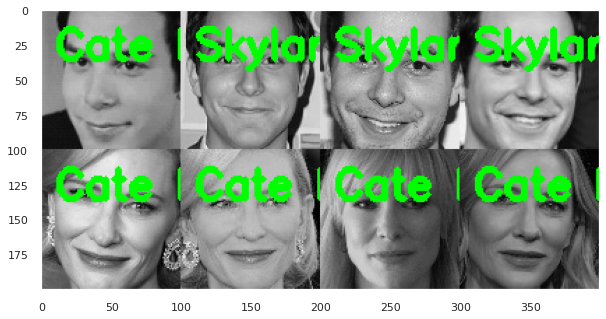

In [ ]:
#TEST DATA
params = {'orientations': 9, 'pixels_per_cell': (10, 10), 'cells_per_block': (2, 2), 'transform_sqrt':True, 'block_norm':'L2'}
test_data, test_labels, resulted_imgs, predictions = test_images(params)

personAface = np.hstack((resulted_imgs[6], resulted_imgs[7], resulted_imgs[8], resulted_imgs[9]))
personBface = np.hstack((resulted_imgs[10],resulted_imgs[11],resulted_imgs[12],resulted_imgs[13]))
all_faces = np.vstack((personAface,personBface))

plt.figure(figsize=(10,12))
plt.imshow(all_faces)

print('Test Score: ', model.score(test_data, test_labels))
print('\nPredicted Labels: ', predictions)


As we can see from above, the classification was not perfect and generated some errors (E.g., Skylar was mispredicted as Cate in the first image). This model has an accuracy of 0.95.
Next we see if HOG is invariant to rotation of images.

Testing 1 images
[INFO] extracting features... for image Astin_Face_1.jpg
Testing Succeeded


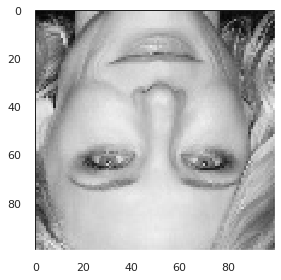

In [ ]:
rotated = imutils.rotate(faces[38], 180)
imshow(rotated)
test_data, test_labels, resulted_imgs, predictions = test_images(params, [rotated], [1])

Testing 1 images
[INFO] extracting features... for image Astin_Face_1.jpg
Testing Succeeded


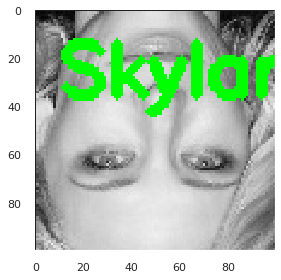

In [ ]:
test_data, test_labels, resulted_imgs, predictions = test_images(params, [rotated], [1])
imshow(resulted_imgs[0])

Therefore, we see that HOG is not invariant to rotation. However, we can improve the classification accuracy by doing some HOG parameter tuning.
This will be done by performing a  Grid Search on different HOG parameters using sklearn's Grid Search method.

In [ ]:
#Some Helper methods and classes for the HOG pipeline to be used in Grid Search
class RGB2GrayTransformer(BaseEstimator, TransformerMixin):
    """
    Convert an array of RGB images to grayscale
    """
 
    def __init__(self):
        pass
 
    def fit(self, X, y=None):
        """returns itself"""
        return self
 
    def transform(self, X, y=None):
        """perform the transformation and return an array"""
        return np.array([rgb2gray(img) for img in X])
 
 
class HogTransformer(BaseEstimator, TransformerMixin):
    """
    Expects an array of 2d arrays (1 channel images)
    Calculates hog features for each img
    """
 
    def __init__(self, y=None, orientations=9,
                 pixels_per_cell=(8, 8),
                 cells_per_block=(3, 3), block_norm='L2-Hys', transform_sqrt=True):
        self.y = y
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        self.block_norm = block_norm
        self.transform_sqrt = transform_sqrt
 
    def fit(self, X, y=None):
        return self
 
    def transform(self, X, y=None):
 
        def local_hog(X):
            return hog(X,
                       orientations=self.orientations,
                       pixels_per_cell=self.pixels_per_cell,
                       cells_per_block=self.cells_per_block,
                       block_norm=self.block_norm, transform_sqrt=self.transform_sqrt)
 
        try: # parallel
            return np.array([local_hog(img) for img in X])
        except:
            return np.array([local_hog(img) for img in X])


In [ ]:
#Defining the HOG pipeline
HOG_pipeline = Pipeline([
    ('grayify', RGB2GrayTransformer()),
    ('hogify', HogTransformer(
        pixels_per_cell=(8, 8),
        cells_per_block=(2,2),
        orientations=9,
        block_norm='L2-Hys',
        transform_sqrt= True)
    ),
    ('scalify', StandardScaler()),
    ('classify', KNeighborsClassifier(n_neighbors=1))
])

param_grid = [
    {'hogify__orientations': [9],
    'hogify__cells_per_block': [(2, 2), (3, 3)],
    'hogify__pixels_per_cell': [(8, 8), (14, 14)],
    'hogify__block_norm': ['L1','L2','L2-Hys', 'L1-sqrt'],
    'hogify__transform_sqrt': [True, False]},
]
grid_search = GridSearchCV(HOG_pipeline, param_grid, cv=3, n_jobs=-1, scoring='accuracy',verbose=1, return_train_score=True)
print(len(training_images))
print(len(labels))
grid_res = grid_search.fit(training_images, labels)
# description of the best performing object, a pipeline in our case.

print(grid_res.best_estimator_)
print('Train Score: ', model.score(data, labels))

40
40
Fitting 3 folds for each of 32 candidates, totalling 96 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    9.8s


Pipeline(memory=None,
         steps=[('grayify', RGB2GrayTransformer()),
                ('hogify',
                 HogTransformer(block_norm='L2-Hys', cells_per_block=(2, 2),
                                orientations=9, pixels_per_cell=(14, 14),
                                transform_sqrt=True, y=None)),
                ('scalify',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('classify',
                 KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                      metric='minkowski', metric_params=None,
                                      n_jobs=None, n_neighbors=1, p=2,
                                      weights='uniform'))],
         verbose=False)
Train Score:  1.0


[Parallel(n_jobs=-1)]: Done  96 out of  96 | elapsed:   19.1s finished


The best results are found for these parameters.

In [ ]:
# the highscore during the search
print(grid_res.best_score_)
pp = pprint.PrettyPrinter(width=41, compact=True)
pp.pprint(grid_res.best_params_)

0.9505494505494506
{'hogify__block_norm': 'L2-Hys',
 'hogify__cells_per_block': (2, 2),
 'hogify__orientations': 9,
 'hogify__pixels_per_cell': (14, 14),
 'hogify__transform_sqrt': True}


The model is then retrained using these parameters and the accuracy is checked against the test data.

Training 40 images
[INFO] extracting features... for image Astin_Face_1.jpg
[INFO] extracting features... for image Astin_Face_2.jpg
[INFO] extracting features... for image Astin_Face_3.jpg
[INFO] extracting features... for image Astin_Face_4.jpg
[INFO] extracting features... for image Astin_Face_5.jpg
[INFO] extracting features... for image Astin_Face_6.jpg
[INFO] extracting features... for image Astin_Face_7.jpg
[INFO] extracting features... for image Astin_Face_8.jpg
[INFO] extracting features... for image Astin_Face_9.jpg
[INFO] extracting features... for image Astin_Face_10.jpg
[INFO] extracting features... for image Astin_Face_11.jpg
[INFO] extracting features... for image Astin_Face_12.jpg
[INFO] extracting features... for image Astin_Face_13.jpg
[INFO] extracting features... for image Astin_Face_14.jpg
[INFO] extracting features... for image Astin_Face_15.jpg
[INFO] extracting features... for image Astin_Face_16.jpg
[INFO] extracting features... for image Astin_Face_17.jpg
[INF

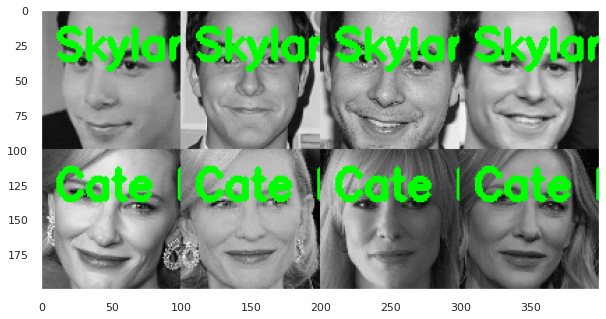

In [ ]:
params = {'orientations': 9, 'pixels_per_cell': (14, 14), 'cells_per_block': (2, 2), 'transform_sqrt':True, 'block_norm':'L2-Hys'}
#Train Data
training_data, training_labels = train_images(params)

model = KNeighborsClassifier(n_neighbors=1)
model.fit(training_data, training_labels)
print('Train Score: ', model.score(training_data, training_labels))
print("\n")

#Test DATA
test_data, test_labels, resulted_imgs, predictions = test_images(params)
personAface = np.hstack((resulted_imgs[6], resulted_imgs[7], resulted_imgs[8], resulted_imgs[9]))
personBface = np.hstack((resulted_imgs[10],resulted_imgs[11],resulted_imgs[12],resulted_imgs[13]))
all_faces = np.vstack((personAface,personBface))

plt.figure(figsize=(10,12))
plt.imshow(all_faces)

print('Test Score: ', model.score(test_data, test_labels))
print('\nPredicted Labels: ', predictions)
print(test_data[0].shape)

Next we check if the new parameters have improved the rotation invariance for HOG.

Testing 1 images
[INFO] extracting features... for image Astin_Face_1.jpg
Testing Succeeded


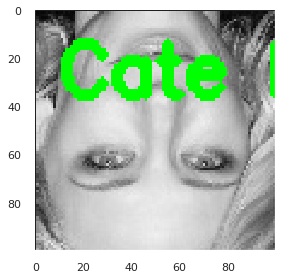

In [ ]:
test_data, test_labels, resulted_imgs, predictions = test_images(params, [rotated], [1])
imshow(resulted_imgs[0])

##5.1 Classification

---



###5.1.1 Handcrafted features (HOG)





In the previous section, we computed the HOG feature vectors for our training data using the optimal parameters for HOG pipeline. Now we focus on the classification by using SVM classifier. The role of this classifier is to recognise person A (class 0) and person B (class 1). The training data consists of HOG vectors of 40 facial images Person A and Person B. The test data consists of HOG vectors of 20 facial images Person A and Person B.

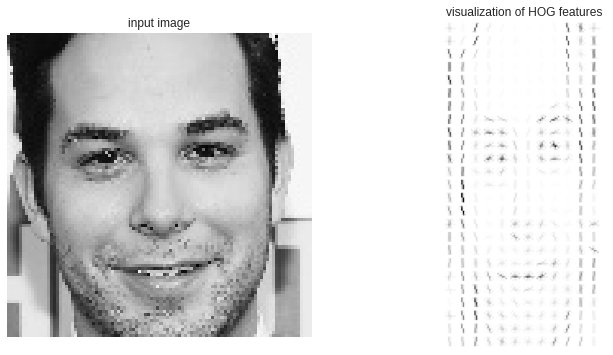

In [ ]:
image = faces[0]
hog_vec,h_i ,hog_vis = create_hog_features(image)
fig, ax = plt.subplots(1, 2, figsize=(12, 6), subplot_kw=dict(xticks=[], yticks=[]))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('input image')

ax[1].imshow(h_i)
ax[1].set_title('visualization of HOG features');

In [ ]:
# Helper method to plot the confusion matrix 
def plot_confusion_matrix(cmx, vmax1=None, vmax2=None, vmax3=None):
    cmx_norm = 100*cmx / cmx.sum(axis=1, keepdims=True)
    cmx_zero_diag = cmx_norm.copy()
 
    np.fill_diagonal(cmx_zero_diag, 0)
 
    fig, ax = plt.subplots(ncols=3)
    fig.set_size_inches(12, 3)
    [a.set_xticks(range(6)) for a in ax]
    [a.set_yticks(range(6)) for a in ax]
 
    im1 = ax[0].imshow(cmx, vmax=vmax1)
    ax[0].set_title('as is')
    im2 = ax[1].imshow(cmx_norm, vmax=vmax2)
    ax[1].set_title('%')
    im3 = ax[2].imshow(cmx_zero_diag, vmax=vmax3)
    ax[2].set_title('% and 0 diagonal')
 
    dividers = [make_axes_locatable(a) for a in ax]
    cax1, cax2, cax3 = [divider.append_axes("right", size="5%", pad=0.1)
                        for divider in dividers]
 
    fig.colorbar(im1, cax=cax1)
    fig.colorbar(im2, cax=cax2)
    fig.colorbar(im3, cax=cax3)
    fig.tight_layout()
  
# the types appear in this order
print('\n Classes', sorted(np.unique(y_test)))



 Classes [0, 1]


[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Accuracy: 1.0


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



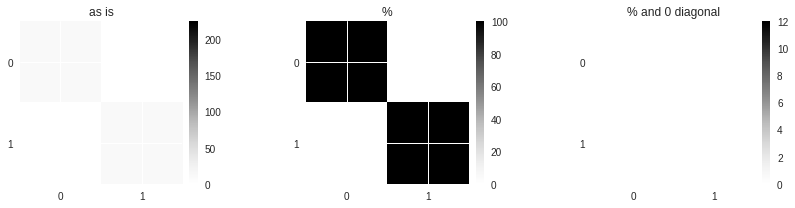

In [ ]:
clf = svm.SVC()
params = {'orientations': 9, 'pixels_per_cell': (14, 14), 'cells_per_block': (2, 2), 'transform_sqrt':True, 'block_norm':'L2-Hys'}

clf.fit(training_data,y_train)
test_set = faces[20:30]+faces[50:60]
hog_faces, resulted_imgs, test_data = create_hog_features_for_images(test_set, params) 
y_pred = clf.predict(test_data)
print(y_pred)
print("Accuracy: "+str(accuracy_score(y_test, y_pred)))
print('\n')
print(classification_report(y_test, y_pred))
cmx_svm = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cmx_svm, vmax1=225, vmax2=100, vmax3=12)

From above it can be observed that the classification comes out to be 100% accurate when we have limited test images of Person A and B only.
We then expand the test data set to include celebrities who are lookalikes of the ones used in the trainig dataset and compute their hog vectors. We then classify it using SVM and plot its accuracy and confusion matrix below. Person A and C are to be classified as '0' and Person B and D are to classified as '1'.

[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 0 1 0 1 1 0 1 1 1 1
 0 1 1]
Accuracy: 0.9


              precision    recall  f1-score   support

           0       0.90      0.90      0.90        20
           1       0.90      0.90      0.90        20

    accuracy                           0.90        40
   macro avg       0.90      0.90      0.90        40
weighted avg       0.90      0.90      0.90        40



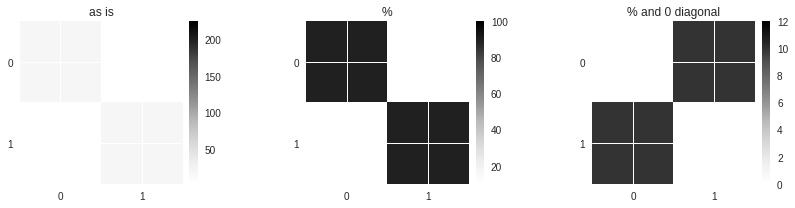

In [ ]:
clf = svm.SVC()
params = {'orientations': 9, 'pixels_per_cell': (14, 14), 'cells_per_block': (2, 2), 'transform_sqrt':True, 'block_norm':'L2-Hys'}

clf.fit(training_data,y_train)
test_set = faces[20:30]+faces[50:60]+faces[60:70]+faces[70:80]
hog_faces, resulted_imgs, test_data = create_hog_features_for_images(test_set, params) 
y_pred = clf.predict(test_data)
print(y_pred)
print("Accuracy: "+str(accuracy_score(y_test_all, y_pred)))
print('\n')
print(classification_report(y_test_all, y_pred))
cmx_svm = confusion_matrix(y_test_all, y_pred)
plot_confusion_matrix(cmx_svm, vmax1=225, vmax2=100, vmax3=12)

The accuracy on complete data set comes out to be 0.9
We then perform Grid Search on SVM classifier and are able to improve the classification accuracy from 0.9 to 0.925.

In [ ]:
grid = GridSearchCV(LinearSVC(), {'C': [1.0, 2.0, 4.0, 8.0]})
grid.fit(training_data,y_train)
grid.best_score_

0.95

In [ ]:
grid.best_params_

{'C': 1.0}

In [ ]:
model_svm = grid.best_estimator_
model_svm.fit(training_data,y_train)

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

Plotting the confusion matrix below.

[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1
 0 1 1]
Accuracy: 0.925


                precision    recall  f1-score   support

  Skylar Astin       0.95      0.90      0.92        20
Cate Blanchett       0.90      0.95      0.93        20

      accuracy                           0.93        40
     macro avg       0.93      0.93      0.92        40
  weighted avg       0.93      0.93      0.92        40



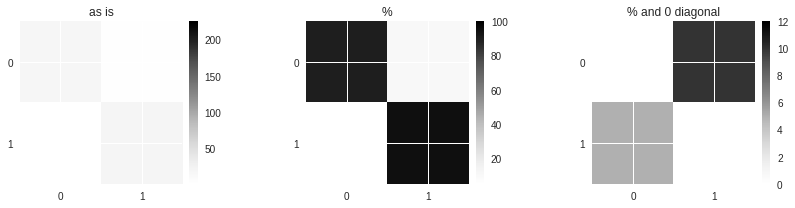

In [ ]:
test_set = faces[20:30]+faces[50:60]+faces[60:70]+faces[70:80]
hog_faces, resulted_imgs, test_data = create_hog_features_for_images(test_set, params) 
y_pred = model_svm.predict(test_data)
print(y_pred)
print("Accuracy: "+str(accuracy_score(y_test_all, y_pred)))
print('\n')
print(classification_report(y_test_all, y_pred, target_names=target_names))
cmx_svm = confusion_matrix(y_test_all, y_pred)
plot_confusion_matrix(cmx_svm, vmax1=225, vmax2=100, vmax3=12)

Predicted Images are shown below. As it can be observed, 3 out of 40 test images, were predicted incorrectly. 
We enhance our algorithm to improve the classificiation accuracy for these incorrect images as well in section 5.3.

Classification Results using SVM


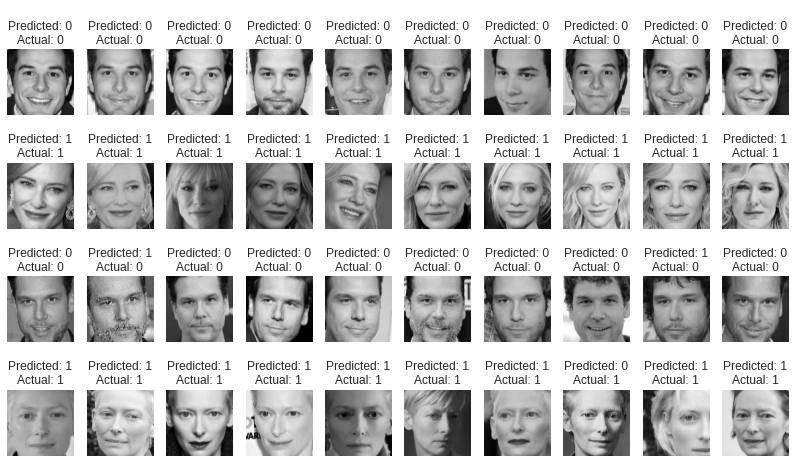

In [ ]:
fig, ax = plt.subplots(4, 10, figsize=(14, 8))
print("Classification Results using SVM")
j = 0
for i, axi in enumerate(ax.flat):
    img = cv2.resize(resulted_imgs[j], (100,100))
    axi.imshow(img, cmap='gray')
    axi.set_title("\nPredicted: {}\nActual: {}".format(y_pred[j], y_test_all[j]))
    axi.axis('off')
    j += 1

###5.1.4 Discussion

####HOG:
Since HOG classifiers were first introduced in 1986, they are not as powerful as the modern neural network classifiers and may break down in complex scenes. However, advantage of using HOG based classifier is that they can be extracted via CPUs of a laptop instead of GPUs. Additionally they can be trained and evlauated very fast. Here HOG features were calculated using 9 degree bings. Using HOG + SVM classifier, we were able to achieve the accuracy of 0.925. However, this accuracy has been further improved in section 5.3.1 after modifying the algorithm.

##5.2 Identification

---



### 5.2.1 HOG

In this section, we compute the similarity between the training and the test images using Euclidean Distance and then find the K nearest neighbours of an input image based on the similarity score. Here K is chosen as 5. First we choose a random image with person A or B from the test data and find 5 most similar looking faces for it from the training images.

In [ ]:
n_neighbors = 5
model = NearestNeighbors(n_neighbors=n_neighbors, algorithm='brute', metric='euclidean')
nbrs = model.fit(training_data, y_train)
value = randint(0, 20)
distances, indices = nbrs.kneighbors([test_data[value]])

print("Indices: ", indices)
print("Distances: ",distances)

Indices:  [[ 4  5  9  3 20]]
Distances:  [[4.15579182 4.53636916 4.54151696 4.74598927 4.7828586 ]]


0
Similarity Scores from original image


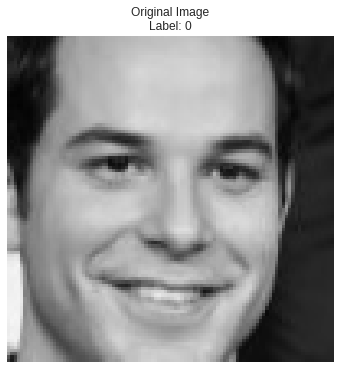

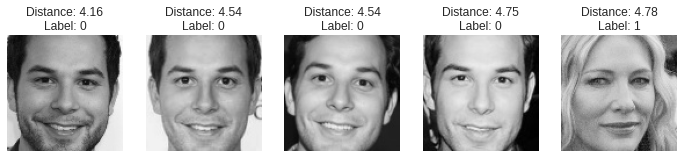

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6), subplot_kw=dict(xticks=[], yticks=[]))
original = cv2.resize(resulted_imgs[value], (100,100))
ax.imshow(original, cmap='gray')
ax.set_title("Original Image\nLabel: {}".format(y_test_all[value]) )
fig, ax = plt.subplots(1, n_neighbors, figsize=(12, 6))
print(y_pred[value])
print("Similarity Scores from original image")
for i, axi in enumerate(ax.flat):
    img = cv2.resize(training_images[indices[0][i]], (100,100))
    axi.imshow(img, cmap='gray')
    axi.set_title("Distance: {}\nLabel: {}".format(round(distances[0][i], 2), y_train[indices[0][i]]))
    axi.axis('off')

Next we choose a random image from persons C and D in the test data and find the 8 most similar faces with it from the training data. The goal here is to identify the lookalikes of the celebrities given as input.

In [ ]:
n_neighbors = 8
model = NearestNeighbors(n_neighbors=n_neighbors, algorithm='brute', metric='euclidean')
nbrs = model.fit(training_data, y_train)
value = randint(20, 39)
print(value)
distances, indices = nbrs.kneighbors([test_data[value]])
print(indices)
distances

32
[[28  6 12 19  7  3 34 25]]


array([[4.38174349, 4.3867455 , 4.54684068, 4.69616636, 4.73982308,
        4.84276507, 4.90569031, 4.90934545]])

Similarity Scores from original image


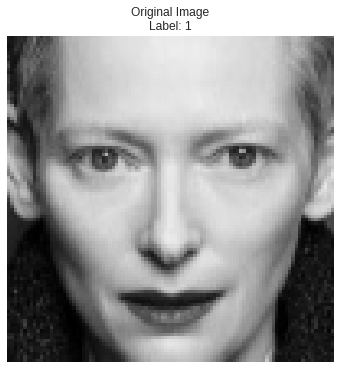

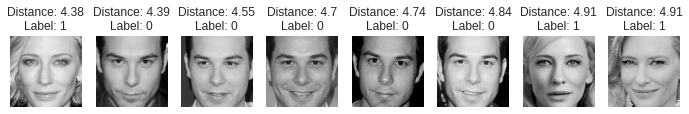

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6), subplot_kw=dict(xticks=[], yticks=[]))
original = cv2.resize(resulted_imgs[value], (100,100))
ax.imshow(original, cmap='gray')
ax.set_title("Original Image\nLabel: {}".format(y_test_all[value]) )

fig, ax = plt.subplots(1, n_neighbors, figsize=(12, 6))
# print(y_pred[value])
print("Similarity Scores from original image")
for i, axi in enumerate(ax.flat):
    img = cv2.resize(training_images[indices[0][i]], (100,100))
    axi.imshow(img, cmap='gray')
    axi.set_title("Distance: {}\nLabel: {}".format(round(distances[0][i], 2), y_train[indices[0][i]]))
    axi.axis('off')

As we see from above, the Identification is not very accurate when we have a large k. For shorter nighbourhood, identification works fine.

###5.2.4 Discussion

####HOG:
For identification with HOG, k nearest neighbours algorithm was used to find k most similar faces from the training set to the test image provided. A similarity metrics of Eculidean Distance was calculated between all the pairs of data. The identification was pretty accurate when k is small but for larger k such as 8, it returns false positives.

##5.3 Impress your TA’s

---



### 5.3.1 Improving Classification Accuracy for HOG and SVM

As it was observed in section 5.1.1, the model incorrectly predicted the image below of Person D (1) as Person A (0). Therefore, in this section, we modify the classification algorithm by using the concept of sliding windows.

(2808,)


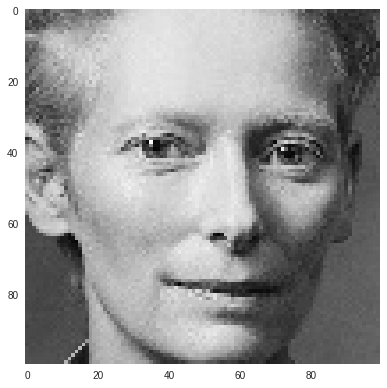

In [ ]:
plt.rcParams["axes.grid"] = False
test_image = cv2.cvtColor(faces[77], cv2.COLOR_RGB2GRAY)   
imshow(test_image)
print(training_data[0].shape)

Using the sliding window, the input image is traversed across multiple sub sections and the HOG feature vector of each sub section is computed. Then, the SVM model is used to predict the result for each HOG feature vector extracted from the sliding window. The optimal parameters derived in section 4.1 were used to calculate HOG features.

In [ ]:
threshold = .3

# define the sliding window:
def sliding_window(image, stepSize, windowSize):# image is the input, step size is the no.of pixels needed to skip and windowSize is the size of the actual window
    # slide a window across the image
    for y in range(0, image.shape[0], stepSize):# this line and the line below actually defines the sliding part and loops over the x and y coordinates
        for x in range(0, image.shape[1], stepSize):
            # yield the current window
            yield (x, y, image[y: y + windowSize[1], x:x + windowSize[0]])

# read the image you want to detect the object in:
img= test_image

# defining the size of the sliding window (has to be, same as the size of the image in the training data)
(winW, winH)= (200,100)
windowSize=(winW,winH)
downscale=1.5
params = {'orientations': 9, 'pixels_per_cell': (14, 14), 'cells_per_block': (2, 2), 'transform_sqrt':True, 'block_norm':'L2-Hys'}
orientations = params['orientations']
pixels_per_cell = params['pixels_per_cell']
cells_per_block = params['cells_per_block']
transform_sqrt = params['transform_sqrt']
block_norm = params['block_norm']

def predict_using_sliding_window(img):
  # Try it with image resized if the image is too big
  img= cv2.resize(img,(300,200)) # can change the size to default by commenting this code out our put in a random number
  orig = img.copy()

  # Test the trained classifier on an image below!
  scale = 0
  detections = []
  slides = []
  slide_hogs = []
  # Apply sliding window:
  for resized in pyramid_gaussian(img, downscale=1.5): # loop over each layer of the image that you take!
      # loop over the sliding window for each layer of the pyramid
      for (x,y,window) in sliding_window(resized, stepSize=10, windowSize=(winW,winH)):
          # if the window does not meet our desired window size, ignore it!
          if window.shape[0] != winH or window.shape[1] !=winW: # ensure the sliding window has met the minimum size requirement
              continue
        
          slides.append(window)
          #creating hog features 
          fds, hog_image = hog(window, orientations=orientations, pixels_per_cell=pixels_per_cell, cells_per_block=cells_per_block, block_norm=block_norm, feature_vector=True, visualize=True, transform_sqrt=transform_sqrt)# fd= feature descriptor
          fds = fds.reshape(1, -1) # re shape the image to make a silouhette of hog
          pred = model_svm.predict(fds) # use the SVM model to make a prediction on the HOG features extracted from the window
          slide_hogs.append(hog_image)
          if pred == 1:
              if model_svm.decision_function(fds) > 0.6:  # set a threshold value for the SVM prediction i.e. only firm the predictions above probability of 0.6
                  print("Detection:: Location -> ({}, {})".format(x, y))
                  print("Scale ->  {} | Confidence Score {} \n".format(scale,model_svm.decision_function(fds)))
                  detections.append((int(x * (downscale**scale)), int(y * (downscale**scale)), model_svm.decision_function(fds),
                                    int(windowSize[0]*(downscale**scale)), # create a list of all the predictions found
                                        int(windowSize[1]*(downscale**scale))))
      scale+=1
      
  clone = resized.copy()
  for (x_tl, y_tl, _, w, h) in detections:
      cv2.rectangle(img, (x_tl, y_tl), (x_tl + w, y_tl + h), (0, 0, 255), thickness = 2)
  rects = np.array([[x, y, x + w, y + h] for (x, y, _, w, h) in detections]) # do nms on the detected bounding boxes
  sc = [score[0] for (x, y, score, w, h) in detections]
  print("detection confidence score: ", sc)
  sc = np.array(sc)
  pick = non_max_suppression(rects, probs = sc, overlapThresh = 0.3)

 # this creates a raw bounding box before using NMS
  nms_score = []
  for (xA, yA, xB, yB) in (pick):
    for i, [xA2, yA2, xB2, yB2] in enumerate(rects):
      if ([xA, yA, xB, yB] ==  [xA2, yA2, xB2, yB2]):
        nms_score.append(sc[i])
 
  # this creates a bounding box after using nms on the detections.
  font = cv2.FONT_HERSHEY_SIMPLEX   # font 
  fontScale = 0.45   # fontScale 
  color = (255, 0, 0)  # Blue color in BGR 
  thickness = 1 # Line thickness of 1 px 
  print("Raw Detections after NMS")
  i = 0
  for (xA, yA, xB, yB) in pick:
      prob_score = "Cate {}".format(round(nms_score[i],2))
      orig = cv2.putText(orig, prob_score, (xA+5,yA-5), font, fontScale, color, thickness, cv2.LINE_AA) 
      cv2.rectangle(orig, (xA, yA), (xB, yB), (0,255,0), 2)
      i +=1

  imshow(orig)
  return orig, slides, slide_hogs

By using the above algorithm, we are able to get correct predictions on the image data which was previously being misclassified.

Detection:: Location -> (80, 0)
Scale ->  0 | Confidence Score [0.61004363] 

Detection:: Location -> (70, 20)
Scale ->  0 | Confidence Score [0.68056585] 

Detection:: Location -> (80, 20)
Scale ->  0 | Confidence Score [0.62266044] 

Detection:: Location -> (90, 20)
Scale ->  0 | Confidence Score [0.75026184] 

Detection:: Location -> (70, 30)
Scale ->  0 | Confidence Score [0.75691569] 

Detection:: Location -> (80, 30)
Scale ->  0 | Confidence Score [0.74969623] 

Detection:: Location -> (90, 30)
Scale ->  0 | Confidence Score [0.75399456] 

Detection:: Location -> (80, 40)
Scale ->  0 | Confidence Score [0.63198205] 

Detection:: Location -> (90, 40)
Scale ->  0 | Confidence Score [0.71249499] 

Detection:: Location -> (70, 90)
Scale ->  0 | Confidence Score [0.61764851] 

Detection:: Location -> (80, 100)
Scale ->  0 | Confidence Score [0.61266756] 

Detection:: Location -> (0, 20)
Scale ->  1 | Confidence Score [0.66778275] 

detection confidence score:  [0.6100436257165937, 0.6

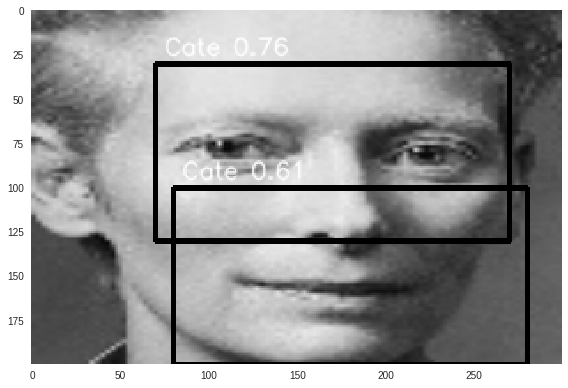

In [ ]:
_, slides, slide_hogs = predict_using_sliding_window(img)

125


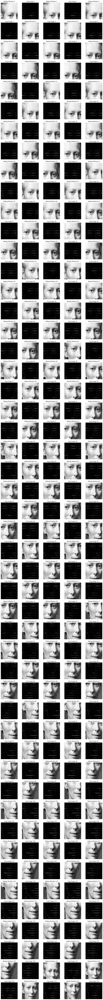

In [ ]:
# Helper method to plot the sliding windows and its corresponding HOG images
def plot_sliding_windows(slides, slide_hogs):
  n_row=50
  n_col=5
  j = 0
  h = 100
  w = 100
  print(len(slides))
  plt.figure(figsize=(1.5 * n_col * 2, 1.5 * n_row * 2))
  for i in range(0, n_row * n_col, 2):
      if (j < len(slides)):
        # show input image
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(cv2.resize(slides[j], (h, w)), cmap=plt.cm.gray)
        plt.title("Sliding Window {}".format(j), size=12)
        plt.xticks(())
        plt.yticks(())

        # show corresponding hog image
        plt.subplot(n_row, n_col, i + 2)
        plt.imshow(cv2.resize(slide_hogs[j], (h, w)), cmap=plt.cm.gray)
        plt.title("Hog Image {}".format(j), size=12)
        plt.xticks(())
        plt.yticks(())
        j+=1

plot_sliding_windows(slides, slide_hogs)

To further check the accuracy of the classifier, we use some additional skewed images of Tilda Swinton (Person D) which should be classified as Cate Blanchett (Person B).

In [ ]:
#Downloading additional images of Tilda Swinton (Person D)
tilda_new_face_dataset_url = "https://drive.google.com/uc?export=download&id=1oorsdCLKFzY-STIFuSIDz_ZfsF5N-3bM"
dir = "/content/sample_data/CV__Group_assignment/Tilda_new_faces.zip"
download(tilda_new_face_dataset_url,dir)
print("All the files are downloaded")

with ZipFile(dir) as zipf:
  zipf.extractall("/content/data/FaceData/Tilda_new_faces")


Download file... /content/sample_data/CV__Group_assignment/Tilda_new_faces.zip ...
File downloaded
All the files are downloaded


In [ ]:
# Set our working path again
new_base_path = "/content/data/FaceData/Tilda_new_faces/"
if not os.path.isdir(new_base_path):
  os.makedirs(new_base_path)

Detection:: Location -> (10, 0)
Scale ->  0 | Confidence Score [0.6542511] 

Detection:: Location -> (0, 10)
Scale ->  0 | Confidence Score [0.64792001] 

Detection:: Location -> (10, 10)
Scale ->  0 | Confidence Score [0.77658325] 

Detection:: Location -> (20, 10)
Scale ->  0 | Confidence Score [0.71085368] 

Detection:: Location -> (0, 20)
Scale ->  0 | Confidence Score [0.60529718] 

Detection:: Location -> (10, 20)
Scale ->  0 | Confidence Score [0.72212248] 

Detection:: Location -> (0, 30)
Scale ->  0 | Confidence Score [0.83593196] 

Detection:: Location -> (10, 30)
Scale ->  0 | Confidence Score [0.76540841] 

Detection:: Location -> (20, 30)
Scale ->  0 | Confidence Score [0.72064879] 

Detection:: Location -> (0, 40)
Scale ->  0 | Confidence Score [0.90212647] 

Detection:: Location -> (10, 40)
Scale ->  0 | Confidence Score [0.68855433] 

Detection:: Location -> (0, 50)
Scale ->  0 | Confidence Score [0.62607076] 

Detection:: Location -> (80, 80)
Scale ->  0 | Confidence S

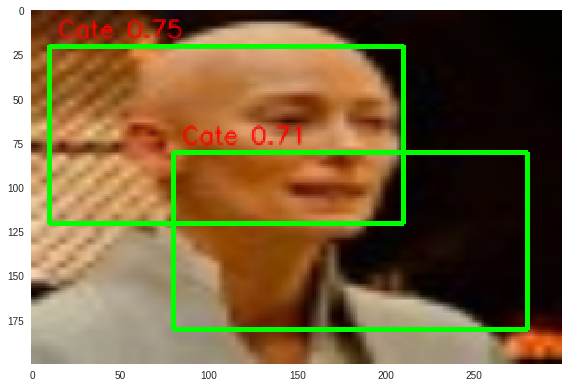

In [ ]:
# Predict new images
new_image_list = ['Tilda_new_'+str(i+1)+'.jpg' for i in range(13)]
new_images = []
predicted_imgs = []
for i, item in enumerate(new_image_list):
    image = cv2.imread(new_base_path+item)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #By default imread reads the images in BGR space, so convert it into RGB
    image = cv2.resize(image,(500,500)) #Resize the images in order to plot it well. This will cause some images to be stretched
    new_images.append(image)
    orig, slides, slide_hogs = predict_using_sliding_window(image)
    predicted_imgs.append(orig)

The predicted images are shown below. Images 2, 4 and 5 don't give any predictions since there is a lot of unnecessary background information also present. However, when we crop the picture 2 and 4 and extract faces from them, we are able to get correct predictions on those images as well (as can be seen from images 12 and 13). The classifier is shown here to be robust to any obstructions, rotations, blurring or illumination. It is also shown to give correct predictions when 2 different people are together in 1 image.

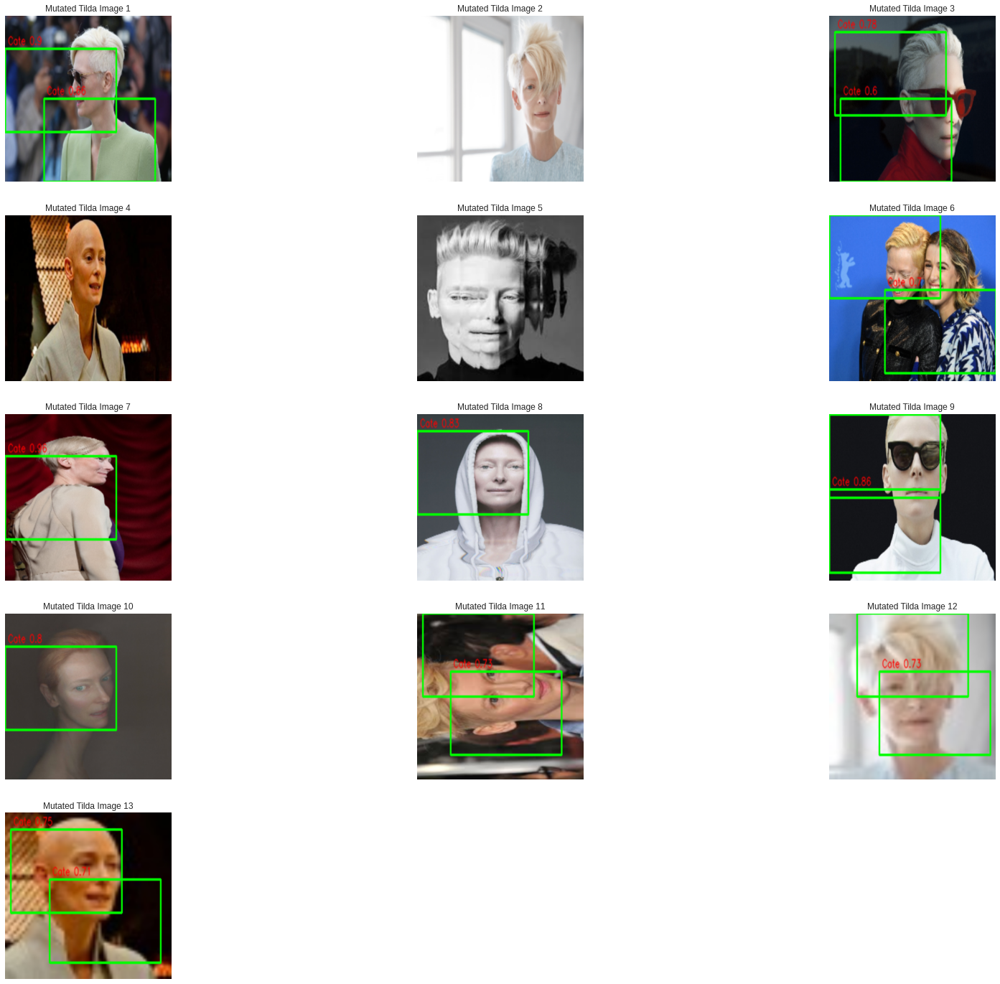

In [ ]:
n_row=8
n_col=6
j = 0
h = 500
w = 500
plt.figure(figsize=(2.5 * n_col * 2, 2.5 * n_row * 2))
for i in range(0, n_row * n_col, 2):
    # show input image
    if j < len(predicted_imgs):
      plt.subplot(n_row, n_col, i + 1)
      plt.imshow(cv2.resize(predicted_imgs[j], (h, w)), cmap=plt.cm.gray)
      plt.title("Mutated Tilda Image {}".format(j+1), size=12)
      plt.xticks(())
      plt.yticks(())
      j+=1

What breaks the HOG + SVM Classifier

detection confidence score:  []
Raw Detections after NMS


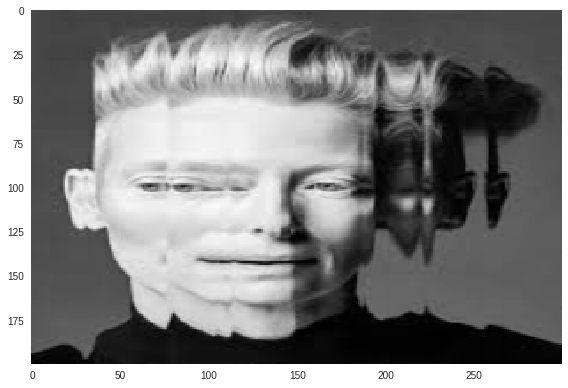

In [ ]:
img = cv2.cvtColor(new_images[4], cv2.COLOR_RGB2GRAY)   
orig, slides, slide_hogs = predict_using_sliding_window(img)

As it can be observed, the above image breaks the classifier as it has two images superimposed over one another. There are three eyes as compared to two and other facial features also seem distorted. This is the reason why the HOG features are not matched with the training images in any of the sliding windows. Hence, resulting in no classifications.

125


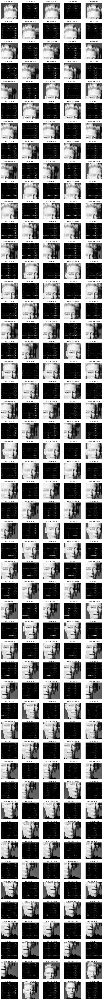

In [ ]:
plot_sliding_windows(slides, slide_hogs)

##6. Discussion

###6.1 HOG
Traditional machine learning techniques were used for object detection and compared with the new ones. Here the traditional Histogram Oriented Gradient approach and the modern techniques such as PCA and transfer learning were used and compared. The object detected was a face of a celebrity and then classification and identification was performed on the celebrities and their look alikes. HOG was used to extract features from images of faces of the celebrities but the classification was not coming out as accurate. However, when we use pyramidal scheme in section 5.3.1 for face detection (using the concept of sliding windows), the classification improved significantly. The reason for this is that for smaller scales, the HOG extraction provides more fine grained features while for larger scales, they provide more global information.

If we were to sell the HOG classification algorithm for authentication of employees through face detection, this algorithm would work fairly well. However, the system can also be fooled easily by camouflage techniques. In that case, it would be advisable to extract every facial feature separately e.g., retina scan, smile, etc., along with complete facial features and then train the classifier on all types of data and average the score to get a final accuracy.

##7. References

[1] A. Consulting, "Histogram of Oriented Gradients | Learn OpenCV", Learnopencv.com, 2020. [Online]. Available: https://www.learnopencv.com/histogram-of-oriented-gradients/. [Accessed: 14- Apr- 2020]

[2] L. Weng, "Object Detection for Dummies Part 1: Gradient Vector, HOG, and SS", Lil'Log, 2020. [Online]. Available: https://lilianweng.github.io/lil-log/2017/10/29/object-recognition-for-dummies-part-1.html. [Accessed: 14- Apr- 2020]

[3] M. Cheon, W. Lee, C. Hyun and M. Park, "Rotation Invariant Histogram of Oriented Gradients", International Journal of Fuzzy Logic and Intelligent Systems, vol. 11, no. 4, pp. 293-298, 2011.

[4] B. Alsahwa, F. Maussang, R. Garello and A. Chevallier, "Marine life airborne observation using HOG and SVM classifier," OCEANS 2016 MTS/IEEE Monterey, Monterey, CA, 2016, pp. 1-5.